# <span style='color:Blue'> Mercari Price Suggestion  </span>


# 1.Business Problem

### 1.1 Problem Description

<pre>Mercari japan biggest online shopping community launched in 1991 powered market place with JPY(jappan currency)10 million in transactions carried out on the platform each month.Mercari expands to the United state in 2014 and United Kingdom in 2016.The main product of mercari is mercari marketplace app which has been downloaded over 100 million times worldwide.People can sell or purchase items easily.user have freedom to choose the price while purchasing the items.There is higher risk since both the customer.small details can mean big diffrences in prices like:-
    
(1) baby iphone 6/6s plus case. price (20$).

(2) Ultra thin rose gold plating clear case for iphone 6/6s price(75$).</pre>


### 1.2  Features in the Dataset

<pre>
(1) name  - the title of the listing. Note that we have cleaned the data to remove text that look like prices (e.g. Nice product at $20) to avoid leakage. These removed prices are represented as (Nice product at).
(2) item_condition_id - the condition of the items provided by the seller.
(3) category_name - category of the listing.
(4) brand_name-
(5) price - the price that the item was sold for. This is the target variable that you will predict. The unit is USD. This column doesn't exist in test.tsv since that is what you will predict.
(6) shipping - 1 if shipping fee is paid by seller and 0 by buyer.
(7) item_description - the full description of the item. Note that we have cleaned the data to remove text that look like prices (e.g. $200).
</pre>

### 1.3 Source

<li> https://www.kaggle.com/c/mercari-price-suggestion-challenge </li>
<li> https://www.kaggle.com/lopuhin/mercari-golf-0-3875-cv-in-75-loc-1900-s </li>
<li> https://arxiv.org/abs/1711.00489 </li>
<li> https://medium.com/swlh/mercari-price-suggestion-challengean-end-to-end-machine-learning-case-study-4a6d833fa1c7</li>
<li> https://www.kaggle.com/valkling/mercari-rnn-2ridge-models-with-notes-0-42755 </li>
<li> https://machinelearningmastery.com/power-transforms-with-scikit-learn </li>


### 1.4 Bussnies Objective and Constraints:-



<pre>Data is provided by kaggle https://www.kaggle.com/c/mercari-price-suggestion challenge,to predict the price of a given product.This problem is regression problem(Supervised Learning).The features we have in train data train_id,name,item_condition_id,category_name,brand_name,shipping, item-description,price in test data except price feature which is our target feature.The feature contain categorical,Numerical and Text.
<li> The target is to solve the problem suggest the resonable price of products.</li>
<li> No strict latency constraints,because the problem demand to suggest a highly.</li> </pre>

## 2.Machine Learning Problem

### 2.1 Data Overview

Get data from https://www.kaggle.com/c/mercari-price-suggestion-challenge
<tr> Data files </tr>
<li> train.tsv </li>
<li> test.tsv </li>

### 2.2 Example Data Point

<pre>train_id name item_condition_id category_name brand_name price	shipping item_description
0 MLB Cincinnati Reds T Shirt Size XL 3	Men/Tops/T-shirts 10.0	1 No description yet 
-------------------------------------------------------------------------------------------------
1 Razer BlackWidow Chroma Keyboard	3 Electronics/Computers & Tablets/Components & Parts Razer	52.0 0 This keyboard is in great condition and works like it came out of the box.All of the ports are tested and work perfectly.The lights are customizable via the Razer Synapse app on your PC.
-------------------------------------------------------------------------------------------------
2 AVA-VIV Blouse 1 Women/Tops & Blouses/Blouse	Target	10.0 1	Adorable top with a hint of lace and a key hole in the back! The pale pink is a 1X, and I also have a 3X available in white!
3 Leather Horse Statues	1 Home/Home DÃ©cor/Home DÃ©cor Accents	35.0 1 New with tags. Leather horses. Retail for [rm] each. Stand about a foot high. They are being sold as a pair. Any questions please ask. Free shipping. Just got out of storage</pre>


### 2.3 Type of Machine Learning Problem

<pre> It is a Regression problem,for a given product we need to predict price of the product.</pre>

### 2.4 Performance metric

<pre> Metric is Root Mean Squared Logarithmic Error(RMSLE).

https://stats.stackexchange.com/questions/56658/how-do-you-interpret-rmsle-root-mean-squared-logarithmic-error
 </pre>

## 3.Exploratory Data Analysis

In [1]:
import warnings

warnings.filterwarnings("ignore")
# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Libraries to tune model, get different metric scores, and split data.
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

#libraries to help with model building
from sklearn.ensemble import (
    AdaBoostRegressor,
    GradientBoostingRegressor,
    RandomForestRegressor,
    BaggingRegressor)
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor
from collections import Counter
from wordcloud import WordCloud, STOPWORDS

### Load Dataset

In [2]:
import pandas as pd
from pandas import DataFrame
train = pd.read_csv("train.tsv", sep="\t")
test=pd.read_csv('test_stg2.tsv',sep="\t")

In [3]:
train.head(5)

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...
3,3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NaN,35.0,1,New with tags. Leather horses. Retail for [rm]...
4,4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NaN,44.0,0,Complete with certificate of authenticity


In [4]:
print(test.shape)

(3460725, 7)


In [5]:
print(train.shape)

(1482535, 8)


In [6]:
test.isnull().sum()

test_id                    0
name                       0
item_condition_id          0
category_name          14833
brand_name           1476490
shipping                   0
item_description           6
dtype: int64

In [7]:
print('Number of data_point is-{} and Number of features/variables is-{}'.format(train.shape[0],train.shape[1]))

Number of data_point is-1482535 and Number of features/variables is-8


In [8]:
train.columns

Index(['train_id', 'name', 'item_condition_id', 'category_name', 'brand_name',
       'price', 'shipping', 'item_description'],
      dtype='object')

In [9]:
data_nan = (train.isnull().sum() / len(train)) * 100
data_nan = data_nan.drop(data_nan[data_nan == 0].index).sort_values(ascending=False)[:10]
missing_data = pd.DataFrame({'Missing Ratio' :data_nan})
missing_data.head(5)

,Missing Ratio
brand_name,42.675687
category_name,0.426769
item_description,0.000270


Text(0.5, 1.0, 'Percent missing data by feature')

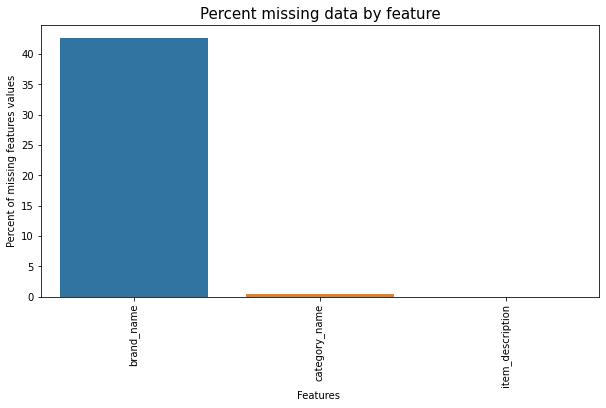

In [10]:
f, ax = plt.subplots(figsize=(10, 5))
plt.xticks(rotation='90')
sns.barplot(x=data_nan.index, y=data_nan)
plt.xlabel('Features ', fontsize=10)
plt.ylabel('Percent of missing features values', fontsize=10)
plt.title('Percent missing data by feature', fontsize=15)

In [11]:
test.isnull().sum()

test_id                    0
name                       0
item_condition_id          0
category_name          14833
brand_name           1476490
shipping                   0
item_description           6
dtype: int64

##### Observation

<li> Only two features contain NaN Values brand_name and category_name 42.6% and 0.42% respectively.

# Univariate Analysis

In [12]:
def perc_on_bar(x):
    total_len = len(train[x]) # length of the column
    plt.figure(figsize=(15,7))
    ax = sns.countplot(train[x],palette='Paired')
    for p in ax.patches:
        per = '{:.1f}%'.format(100 * p.get_height()/total_len) 
        x = p.get_x() + p.get_width() / 2 - 0.10
        y = p.get_y() + p.get_height()          
        ax.annotate(per, (x, y), size = 12) # annotate the percantage 
    plt.show() # show the plot

In [13]:
def plot_categories(feature,title1,title2):
    plt.figure(figsize=(12,12))
    plt.subplot(2,1,1)
    count=train[feature].value_counts()
    sns.barplot(x=count[:15].values, y=count[:15].index)
    plt.title('(a)'+title1,fontsize=15)
    plt.xlabel('Counts', fontsize=13)
    plt.subplot(2,1,2)
    top15 = train.groupby(feature, axis=0).mean()
    data= pd.DataFrame(top15.sort_values('price', ascending = False)['price'][0:15].reset_index())
    plt.title("(b) "+title2, fontsize = 15)
    sns.barplot(x=feature,y="price", data=data, linewidth=0.5)
    plt.xlabel(feature, fontsize = 13)
    plt.ylabel("Sale Price", fontsize = 13)
    plt.xticks(rotation=90)
    plt.show()

## Name

In [14]:
train['name'].describe()

count     1482535
unique    1225273
top        Bundle
freq         2232
Name: name, dtype: object

In [15]:
train['name'].unique()

array(['MLB Cincinnati Reds T Shirt Size XL',
       'Razer BlackWidow Chroma Keyboard', 'AVA-VIV Blouse', ...,
       '21 day fix containers and eating plan', 'World markets lanterns',
       'Brand new lux de ville wallet'], dtype=object)

In [16]:
product_type_count=Counter(list(train['name']))
product_type_count.most_common(10)

[('Bundle', 2232),
 ('Reserved', 453),
 ('Converse', 445),
 ('BUNDLE', 418),
 ('Dress', 410),
 ('Coach purse', 404),
 ('Lularoe TC leggings', 396),
 ('Romper', 353),
 ('Nike', 340),
 ('Vans', 334)]

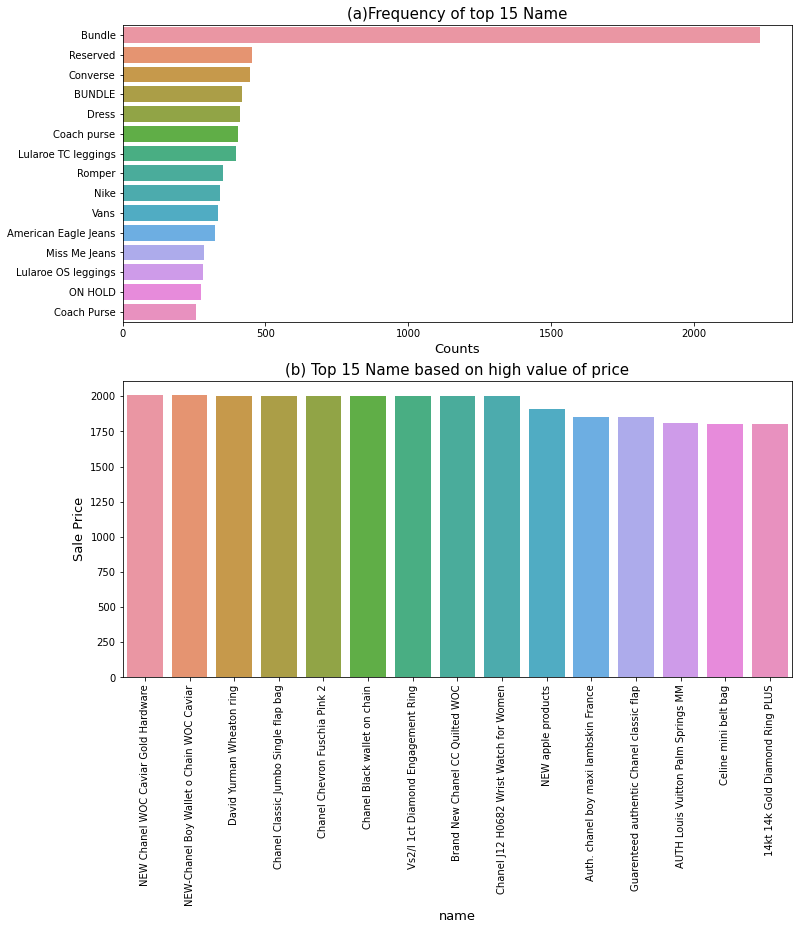

In [17]:
title1='Frequency of top 15 Name'
title2='Top 15 Name based on high value of price'
plot_categories('name',title1,title2)

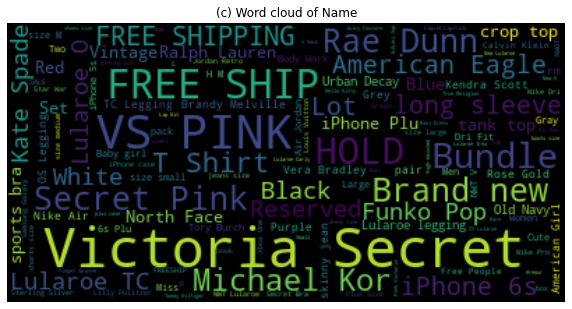

In [18]:
plt.figure(figsize = (10, 10))
plt.title("(c) Word cloud of Name")
wc = WordCloud().generate(" ".join(train['name'].astype(str)))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

##### Observation

<li> figure (a) Frequency of top 15 name.
<li> figure (b) Top 15 name based on decreasing order of price.
<li> ficure (c) Most frequent word in name feature is Victoria,Secret,FREE SHIP,Michael Kor

## Category_name

In [19]:
train['category_name'].describe()

count                                            1476208
unique                                              1287
top       Women/Athletic Apparel/Pants, Tights, Leggings
freq                                               60177
Name: category_name, dtype: object

In [20]:
train['category_name'].isnull().sum()

6327

In [21]:
product_type_count=Counter(list(train['category_name']))
product_type_count.most_common(10)

[('Women/Athletic Apparel/Pants, Tights, Leggings', 60177),
 ('Women/Tops & Blouses/T-Shirts', 46380),
 ('Beauty/Makeup/Face', 34335),
 ('Beauty/Makeup/Lips', 29910),
 ('Electronics/Video Games & Consoles/Games', 26557),
 ('Beauty/Makeup/Eyes', 25215),
 ('Electronics/Cell Phones & Accessories/Cases, Covers & Skins', 24676),
 ('Women/Underwear/Bras', 21274),
 ('Women/Tops & Blouses/Blouse', 20284),
 ('Women/Tops & Blouses/Tank, Cami', 20284)]

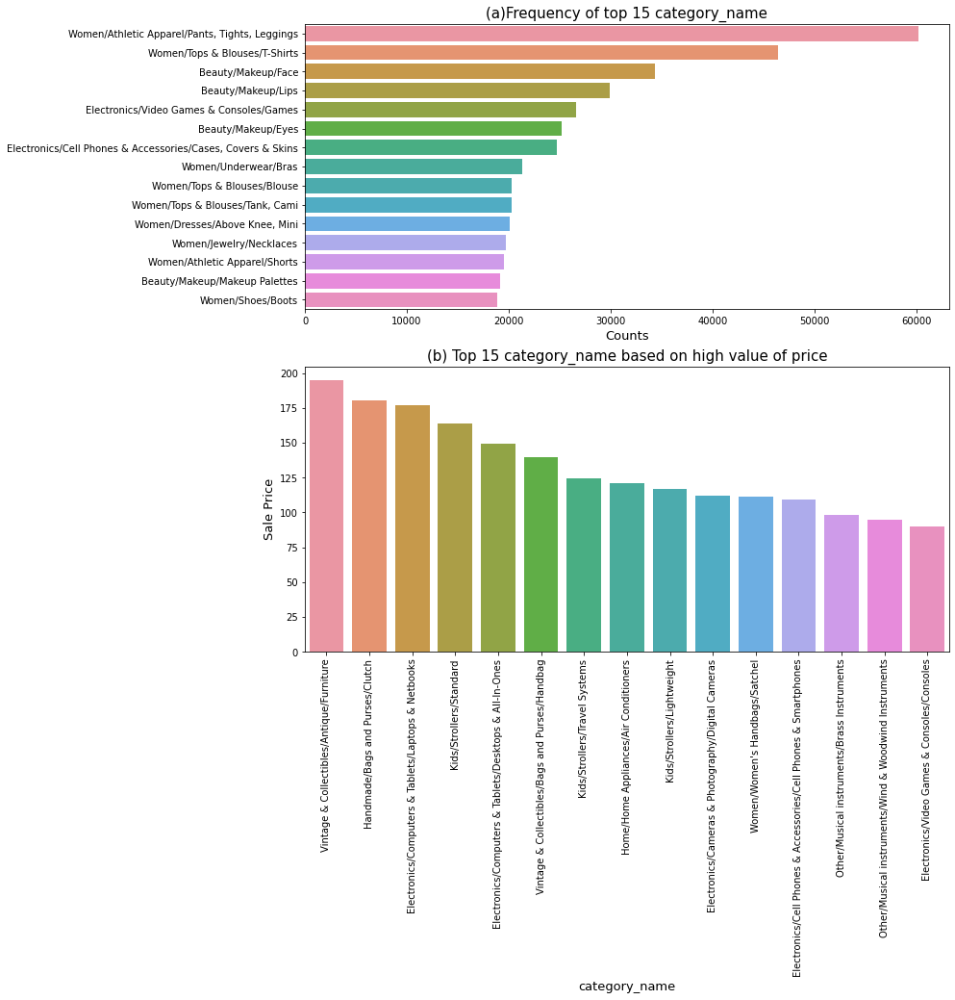

In [22]:
title1='Frequency of top 15 category_name'
title2='Top 15 category_name based on high value of price'
plot_categories('category_name',title1,title2)

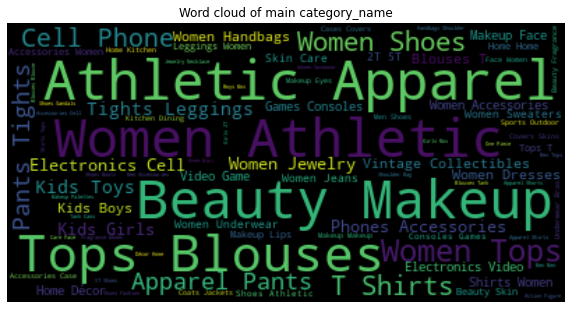

In [23]:
plt.figure(figsize = (10, 10))
plt.title("Word cloud of main category_name")
wc = WordCloud().generate(" ".join(train['category_name'].astype(str)))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

##### Observation

<li> figure (a) Frequency of top 15 Category name.
<li> figure (b) Top 15 category name based on decreasing order of price.
<li> figure (c) Most frequent word in category name feature is Tops,Women,Blouses,Athletic
<li> feature contain NaN values.

In [24]:
category_split_arr = []
def category_split(category_name):
    try:
        val1,val2,val3=category_name.split('/')
        return val1,val2,val3
    except:
        return ('Missing', 'Missing', 'Missing')

In [25]:
train['main_category'], train['sub_category'], train['item_category'] =zip(*train['category_name'].apply(lambda x: category_split(x)))

In [26]:
test['main_categoey'], test['sub_category'], test['item_category'] =zip(*test['category_name'].apply(lambda x: category_split(x)))

In [27]:
# Drop category_name feature
train=train.drop(['category_name'],axis=1)
test=test.drop(["category_name"],axis=1)

### main_category

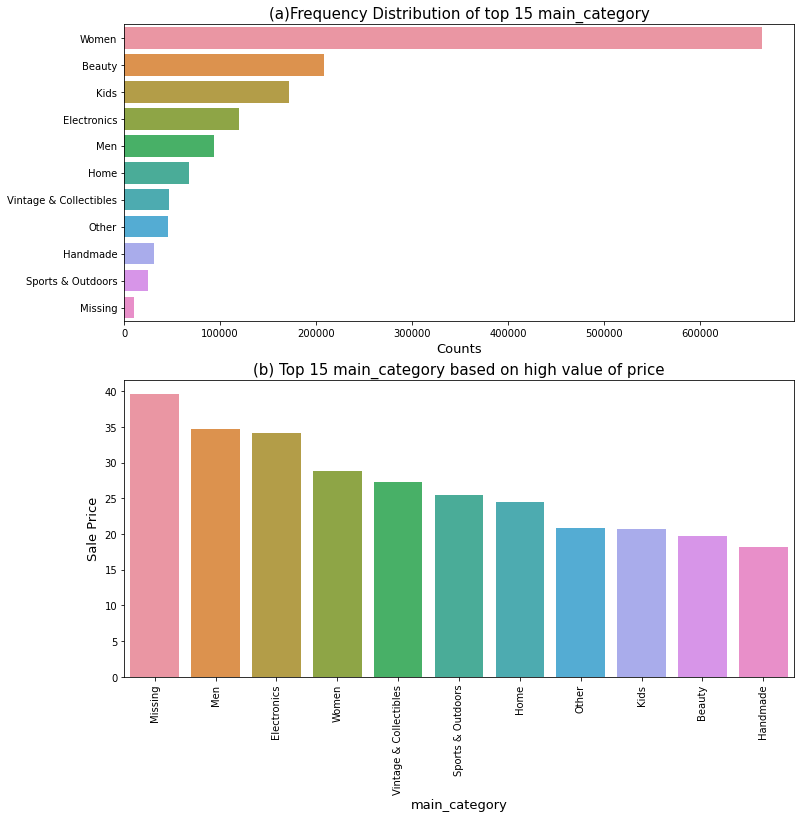

In [28]:
title1='Frequency Distribution of top 15 main_category'
title2='Top 15 main_category based on high value of price'
plot_categories('main_category',title1,title2)

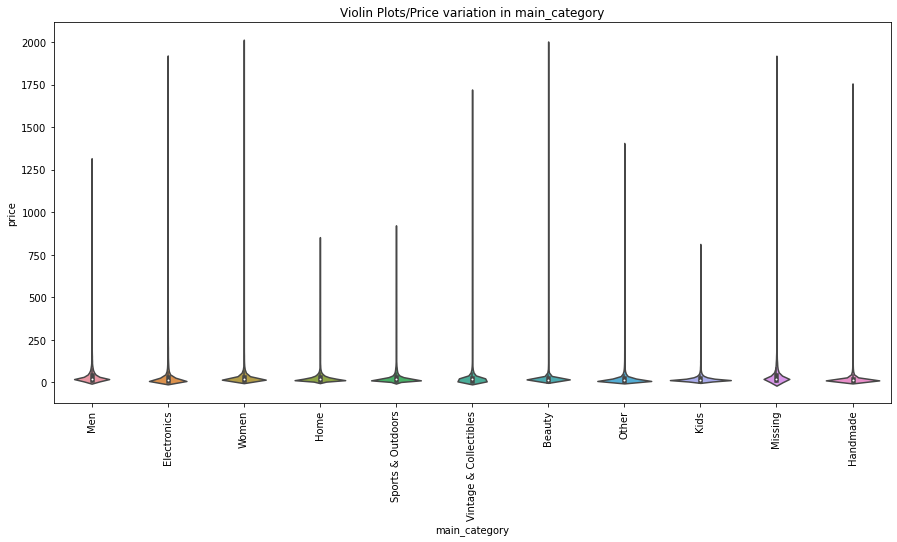

In [29]:
plt.figure(figsize=(15,7))
sns.violinplot(x="main_category", y="price", data = train)
plt.title('Violin Plots/Price variation in main_category')
plt.xticks(rotation=90)
plt.show()

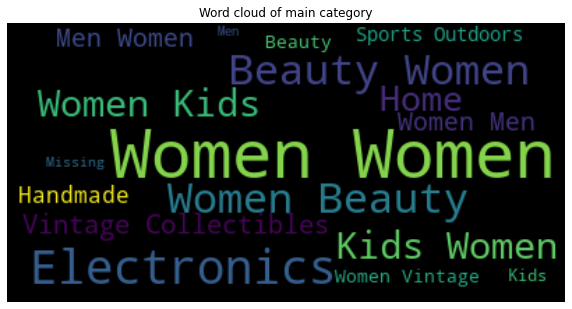

In [30]:
plt.figure(figsize = (10, 10))
plt.title("Word cloud of main category")
wc = WordCloud().generate(" ".join(train['main_category'].astype(str)))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

##### Observation

<li> figure (a) Frequency of top 15 main_category.
<li> figure (b) Top 15 main_category based on decreasing order of price.
<li> figure (c) Most frequent word in main_category feature is Women,Electronics,Beautry Women

### Sub_category

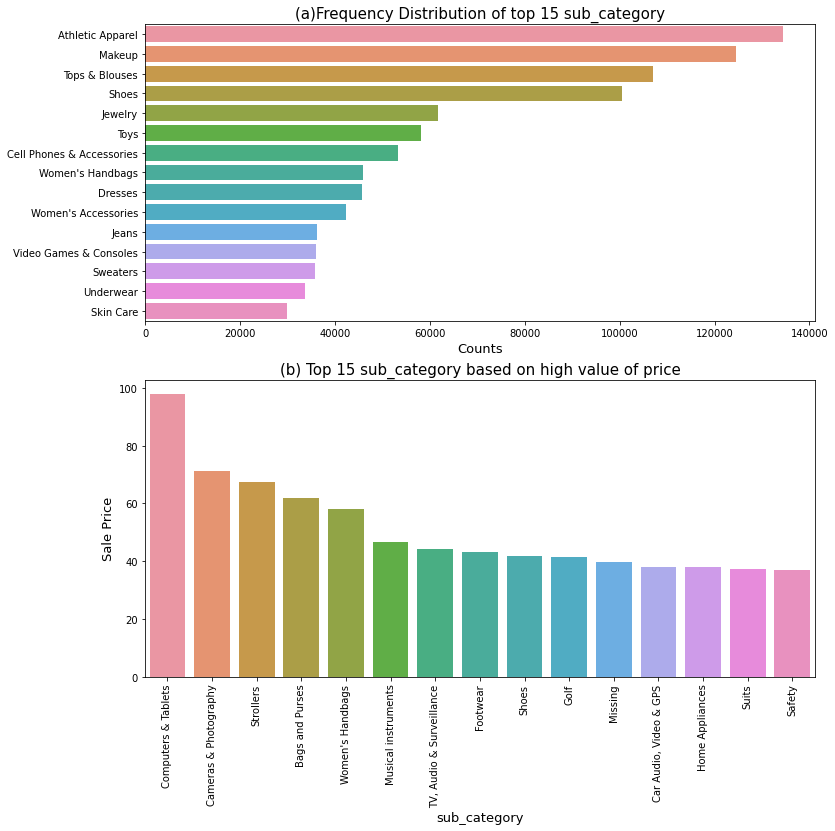

In [31]:
title1='Frequency Distribution of top 15 sub_category'
title2='Top 15 sub_category based on high value of price'
plot_categories('sub_category',title1,title2)

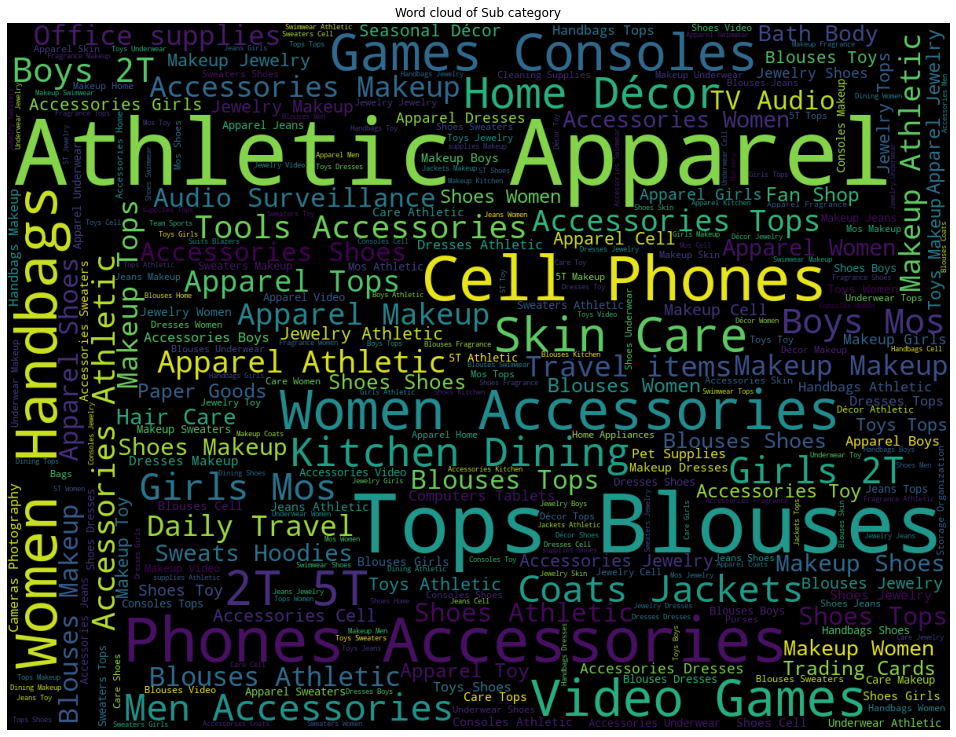

In [32]:
plt.figure(figsize = (18, 13))
plt.title("Word cloud of Sub category")
wc = WordCloud(max_words=300,width = 1200, height = 900).generate(" ".join(train['sub_category'].astype(str)))
plt.imshow(wc)
plt.axis("off")
plt.show()

##### Observation

<li> figure (a) Frequency of top 15 sub_Category.
<li> figure (b) Top 15 sub_category based on decreasing order of price.
<li> figure (c) Most frequent word in sub_category  feature is Home Decor,Cell Phones,Games Consoles,Athletic Apparel

### Item category

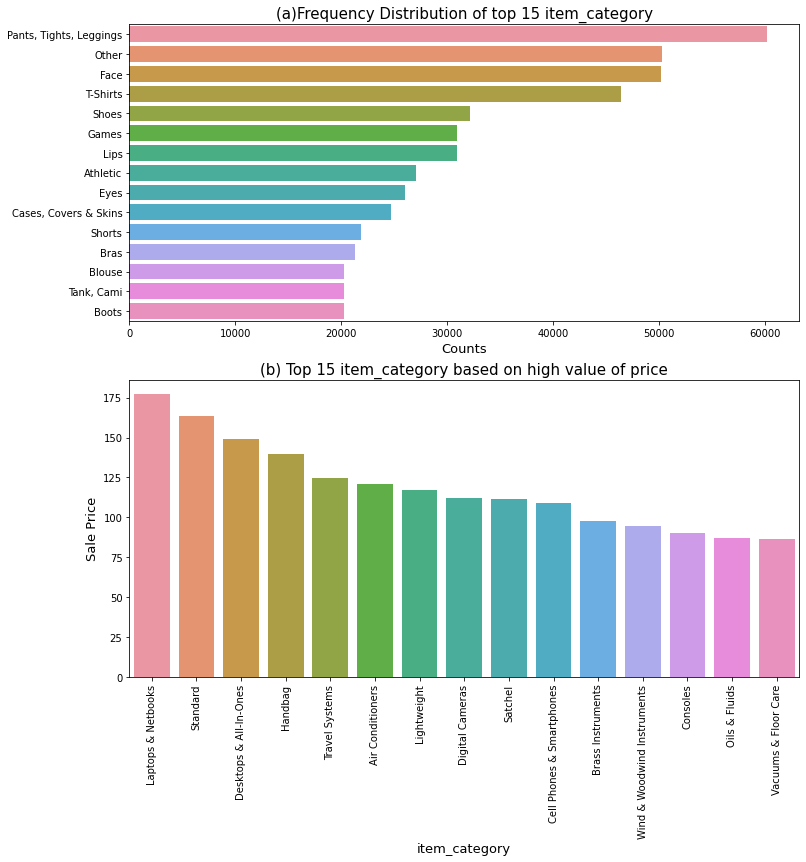

In [33]:
title1='Frequency Distribution of top 15 item_category'
title2='Top 15 item_category based on high value of price'
plot_categories('item_category',title1,title2)

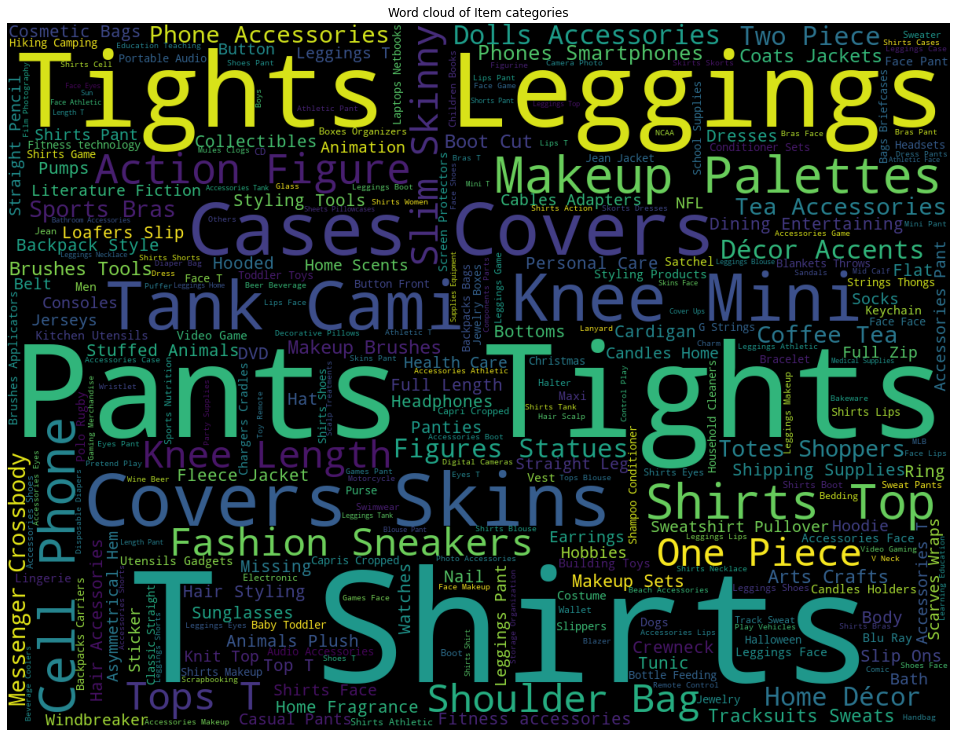

In [34]:
plt.figure(figsize = (18, 13))
plt.title('Word cloud of Item categories')
wc = WordCloud(max_words=300,width = 1200, height = 900).generate(" ".join(train['item_category'].astype(str)))
plt.imshow(wc)
plt.axis("off")
plt.show()

##### Observation

<li> figure (a) Frequency of top 15 Item_Category.
<li> figure (b) Top 15 Item_category based on decreasing order of price.
<li> figure (c) Most frequent word in Item_category feature is Case Covers,Cover Skins,T Shirts,Pants

## Price

In [35]:
train['price'].describe()

count    1.482535e+06
mean     2.673752e+01
std      3.858607e+01
min      0.000000e+00
25%      1.000000e+01
50%      1.700000e+01
75%      2.900000e+01
max      2.009000e+03
Name: price, dtype: float64

In [36]:
product_price_count=Counter(list(train['price']))
product_price_count.most_common(10)

[(10.0, 99416),
 (12.0, 78986),
 (14.0, 76655),
 (16.0, 66413),
 (9.0, 63643),
 (8.0, 61564),
 (15.0, 58082),
 (20.0, 56323),
 (7.0, 52268),
 (18.0, 41243)]

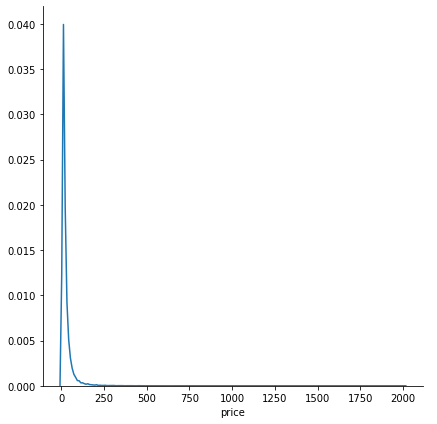

In [37]:
sns.FacetGrid(train,size=6).map(sns.kdeplot,"price").add_legend();
plt.show()

In [38]:
for i in range(0,101,10):
    print("{} th percentile is: {}".format(i,np.percentile(train['price'],i)))

0 th percentile is: 0.0
10 th percentile is: 7.0
20 th percentile is: 10.0
30 th percentile is: 12.0
40 th percentile is: 14.0
50 th percentile is: 17.0
60 th percentile is: 20.0
70 th percentile is: 26.0
80 th percentile is: 34.0
90 th percentile is: 51.0
100 th percentile is: 2009.0


In [39]:
for i in range(90,101,1):
    print("{}th percentile is: {}".format(i,np.percentile(train['price'],i)))

90th percentile is: 51.0
91th percentile is: 55.0
92th percentile is: 58.0
93th percentile is: 62.0
94th percentile is: 67.0
95th percentile is: 75.0
96th percentile is: 85.0
97th percentile is: 99.0
98th percentile is: 122.0
99th percentile is: 170.0
100th percentile is: 2009.0


In [40]:
value=train["price"].values
value= np.sort(value,axis = None)
for i in np.arange(0.0, 1.0, 0.1):
    print("{}th percentile is {}".format(99+i,value[int(len(value)*(float(99+i)/100))]))
print("100th percentile is ",value[-1])

99.0th percentile is 170.0
99.1th percentile is 180.0
99.2th percentile is 189.0
99.3th percentile is 200.0
99.4th percentile is 210.0
99.5th percentile is 231.0
99.6th percentile is 256.0
99.7th percentile is 286.0
99.8th percentile is 340.0
99.9th percentile is 450.0
100th percentile is  2009.0


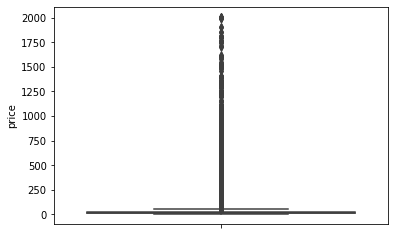

In [41]:
sns.boxplot(y="price", data =train)
plt.show()

In [42]:
train=train[(train['price']>3) & (train['price']<2000)]

In [43]:
import math
#train['price']=[math.log(i) for i in train['price'].values]
import numpy as np
train['log_price'] = np.log(train['price']+1)

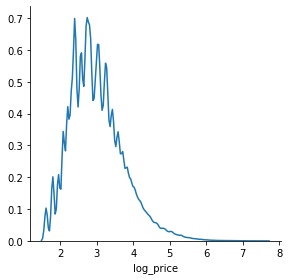

In [44]:
sns.FacetGrid(train,size=4).map(sns.kdeplot,"log_price").add_legend();
plt.show()
#sns.distplot(train['price'], kde=True)

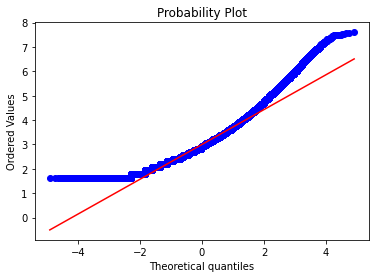

In [45]:
#Q-Q plot for checking if price is log-normal
import scipy
scipy.stats.probplot(train['log_price'].values, plot=plt)
plt.show()

In [46]:
train['log_price'].describe()

count    1.462949e+06
mean     3.001173e+00
std      7.283366e-01
min      1.609438e+00
25%      2.484907e+00
50%      2.890372e+00
75%      3.433987e+00
max      7.600902e+00
Name: log_price, dtype: float64

##### Observation

<li> price feature follow logNormal Distribution convert it into Normal Distribution.
<li> feature contain outliers price less than 3 and greater than 2000 drop it.

##### Observation

<li> Brand contain NaN values replace NaN value by Missing Values.
<li> figure (a) Frequency of top 15 Brand.
<li> figure (b) Top 15 brand based on decreasing order of price.
<li> figure (c) Most frequent word in brand feature is Missing,Secret Missing,Victoria Secret,Missing Nike,Missing Pink.

## Shipping

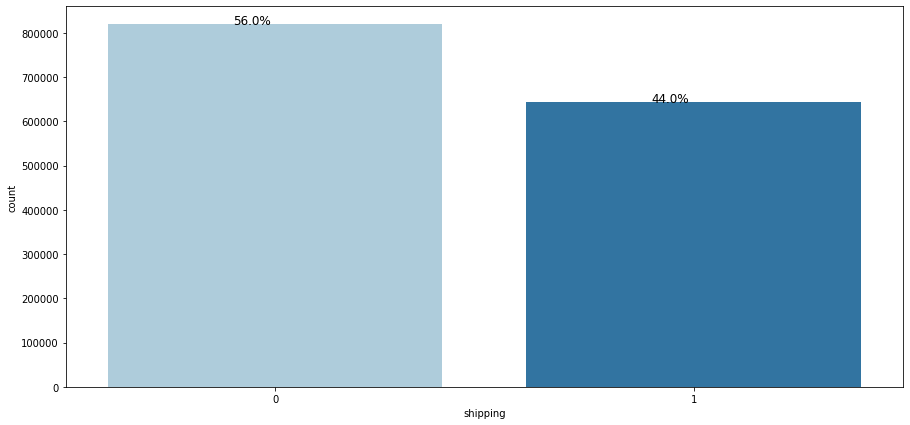

In [47]:
perc_on_bar('shipping')

In [48]:
train.groupby('shipping')['log_price'].describe()

,count,mean,std,min,25%,50%,75%,max
shipping,,,,,,,,
0,818873.0,3.136016,0.689136,1.871802,2.639057,3.044522,3.526361,7.554859
1,644076.0,2.829734,0.740683,1.609438,2.302585,2.772589,3.258097,7.600902


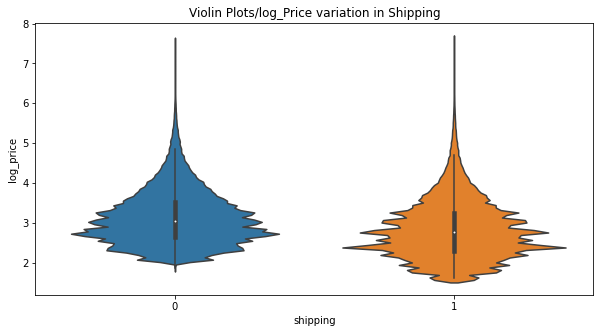

In [49]:
plt.figure(figsize=(10,5))
sns.violinplot(x="shipping", y="log_price", data = train)
plt.title('Violin Plots/log_Price variation in Shipping')
plt.show()

##### Observation

<li> Shipping feature contain 0 is 56% and 1 is 44%.

## Item_condition id

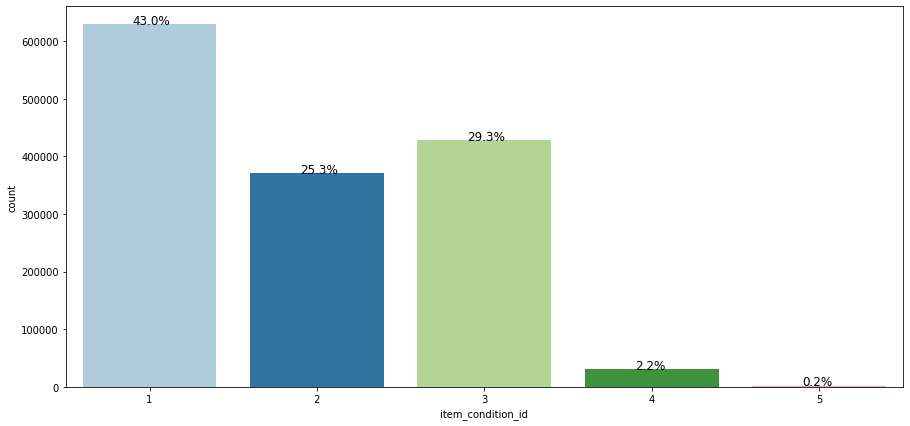

In [50]:
perc_on_bar('item_condition_id')

In [51]:
train.groupby('item_condition_id')['log_price'].describe()

,count,mean,std,min,25%,50%,75%,max
item_condition_id,,,,,,,,
1,629046.0,3.002306,0.740522,1.609438,2.397895,2.944439,3.433987,7.554859
2,370849.0,3.021901,0.725631,1.609438,2.484907,2.944439,3.433987,7.523481
3,429117.0,2.987322,0.712695,1.609438,2.484907,2.833213,3.367296,7.600902
4,31582.0,2.914925,0.707833,1.609438,2.397895,2.772589,3.295837,7.177782
5,2355.0,3.114684,0.810182,1.609438,2.484907,2.995732,3.610918,6.259581


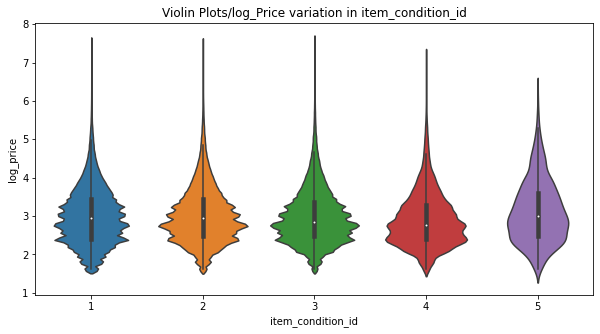

In [52]:
plt.figure(figsize=(10,5))
sns.violinplot(x="item_condition_id", y="log_price", data = train)
plt.title('Violin Plots/log_Price variation in item_condition_id')
plt.show()

##### Observation

<li> Item_condition_id feature contain 1 is 43%,2 is 25.3%,3 is 29.3%,4 is 2.2% and 5 is 0.5%.

# Text Preprocessing

In [53]:
# Remove Emoji
def deEmojify(text):
    regrex_pattern = re.compile(pattern = "["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags = re.UNICODE)
    return regrex_pattern.sub(r'',text)

In [54]:
def decontractions(phrase):
    """decontracted takes text and convert contractions into natural form.
     ref: https://stackoverflow.com/questions/19790188/expanding-english-language-contractions-in-python/47091490#47091490"""
    # specific
    phrase = re.sub(r"won\'t", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)
    phrase = re.sub(r"won\’t", "will not", phrase)
    phrase = re.sub(r"can\’t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)

    phrase = re.sub(r"n\’t", " not", phrase)
    phrase = re.sub(r"\’re", " are", phrase)
    phrase = re.sub(r"\’s", " is", phrase)
    phrase = re.sub(r"\’d", " would", phrase)
    phrase = re.sub(r"\’ll", " will", phrase)
    phrase = re.sub(r"\’t", " not", phrase)
    phrase = re.sub(r"\’ve", " have", phrase)
    phrase = re.sub(r"\’m", " am", phrase)

    return phrase

In [55]:
from nltk.corpus import stopwords
from tqdm import tqdm
import re
stopwords = stopwords.words('english')
def preprocess(text_col,stopword):
    preprocessed = []
    for sentence in tqdm(text_col.values):
        # Replace "carriage return" with "space".
        sentence=str(sentence)
        sent = sentence.replace('\\r', ' ')
        # Replace "quotes" with "space".
        sent = sent.replace('\\"', ' ')
        # Replace "line feed" with "space".
        sent = sent.replace('\\n', ' ')
        # Replace characters between words with "space".
        sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
        #remove stop words
        #decontraction
        sent=decontractions(sent)
        #Remove emoji
        sent=deEmojify(sent)
        if stopword:
            sent = ' '.join(e for e in sent.split() if e not in stopwords)
        # to lowercase
        preprocessed.append(sent.lower().strip())
    return preprocessed

## Item Description

In [56]:
title_count=Counter(list(train['item_description']))
title_count.most_common(10)

[('No description yet', 80586),
 ('New', 4032),
 ('Brand new', 3013),
 ('Good condition', 1258),
 ('Great condition', 1152),
 ('Like new', 984),
 ('Never worn', 826),
 ('NWT', 817),
 ('New with tags', 643),
 ('Excellent condition', 601)]

In [57]:
# Preprocessing on item_description train data.
train['item_description'] = preprocess(train['item_description'],stopword=True)

100%|██████████████████████████████████████████████████████████████████████| 1462949/1462949 [09:03<00:00, 2691.75it/s]


In [58]:
# Preprocessing on item_description test data.
test['item_description'] = preprocess(test['item_description'],stopword=True)

100%|██████████████████████████████████████████████████████████████████████| 3460725/3460725 [21:16<00:00, 2712.13it/s]


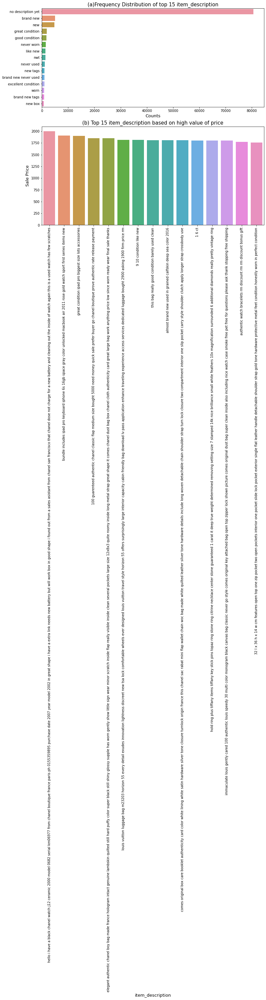

In [59]:
title1='Frequency Distribution of top 15 item_description'
title2='Top 15 item_description based on high value of price'
plot_categories('item_description',title1,title2)

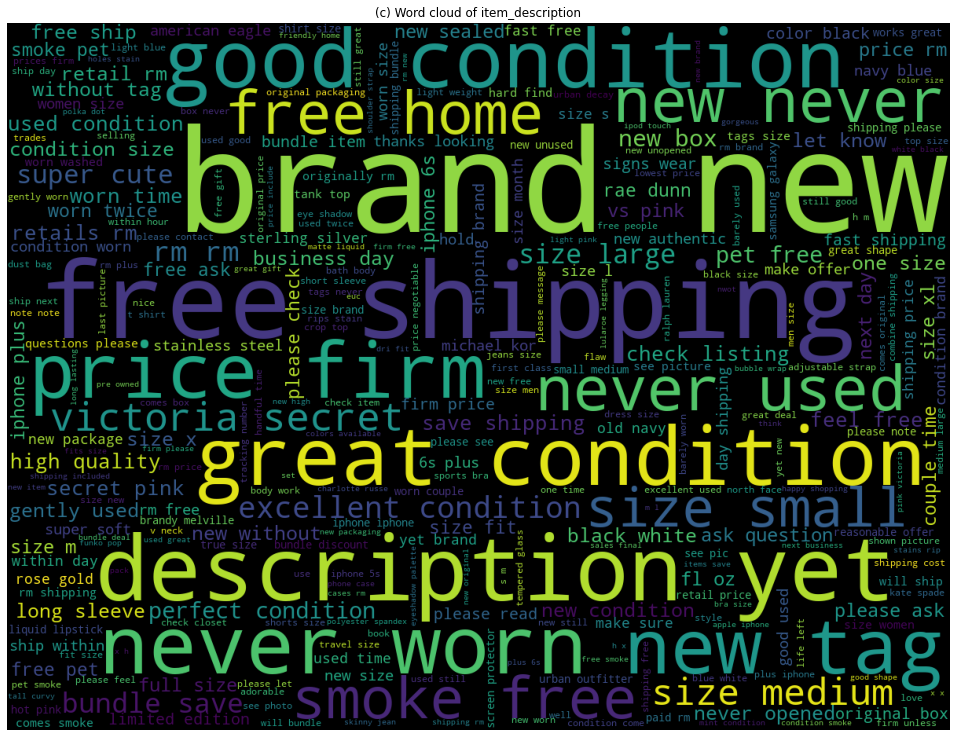

In [60]:
plt.figure(figsize = (18, 13))
plt.title('(c) Word cloud of item_description')
wc = WordCloud(max_words=300,width = 1200, height = 900).generate(" ".join(train['item_description'].astype(str)))
plt.imshow(wc)
plt.axis("off")
plt.show()


##### Observation

<li> figure (a) Frequency of top 15 item_description.
<li> figure (b) Top 15 item_description based on decreasing order of price.
<li> figure (c) Most frequent word in item_description feature is free Shipping,description yet,never used,great condition,brand new.

## Name

In [72]:
title_count=Counter(list(train['name']))
title_count.most_common(10)

[('Bundle', 2232),
 ('Converse', 445),
 ('Reserved', 444),
 ('BUNDLE', 417),
 ('Dress', 408),
 ('Coach purse', 404),
 ('Lularoe TC leggings', 394),
 ('Romper', 352),
 ('Nike', 339),
 ('Vans', 334)]

In [73]:
train['name'] = preprocess(train['name'],stopword=False)

100%|██████████████████████████████████████████████████████████████████████| 1462949/1462949 [03:18<00:00, 7383.83it/s]


In [74]:
train['name'] = preprocess(train['name'],stopword=False)

100%|██████████████████████████████████████████████████████████████████████| 3460725/3460725 [07:50<00:00, 7360.25it/s]


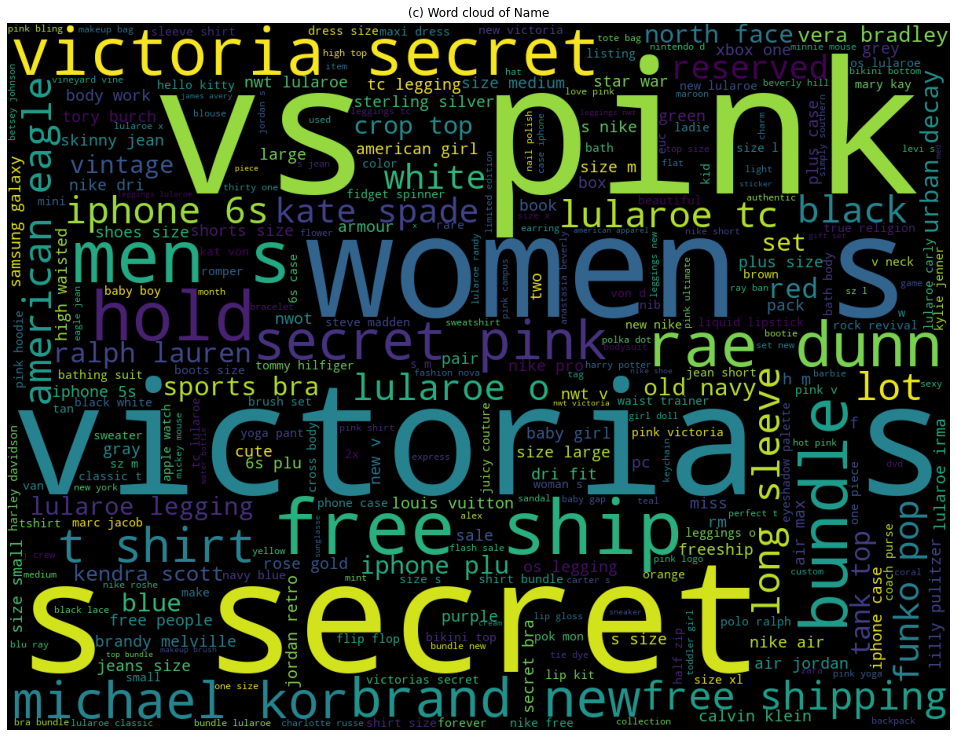

In [65]:
plt.figure(figsize = (18, 13))
plt.title("(c) Word cloud of Name")
wc = WordCloud(max_words=300,width = 1200, height = 900).generate(" ".join(train['name'].astype(str)))
plt.imshow(wc)
plt.axis("off")
plt.show()

##### Observation

<li> figure (c) Most frequent word in name feature is VS PINK,S Secret Missing,Victoria Secret,men s,Women s.

## Brand

In [61]:
train['brand_name'].describe()

count     843884
unique      4790
top         PINK
freq       54019
Name: brand_name, dtype: object

In [62]:
train['brand_name'] = train['brand_name'].fillna(value='Missing')
test['brand_name'] = test['brand_name'].fillna(value='Missing')

In [63]:
product_brand_count=Counter(list(train['brand_name']))
product_brand_count.most_common(10)

[('Missing', 619065),
 ('PINK', 54019),
 ('Nike', 53963),
 ("Victoria's Secret", 47942),
 ('LuLaRoe', 30995),
 ('Apple', 17109),
 ('FOREVER 21', 15025),
 ('Nintendo', 14877),
 ('Lululemon', 14543),
 ('Michael Kors', 13911)]

In [64]:
train['brand_name'] = train['brand_name'].apply(lambda x: str(x).lower())

In [65]:
test['brand_name'] = test['brand_name'].apply(lambda x: str(x).lower())

In [66]:
total_brand=train[train['brand_name']!='missing']['brand_name'].unique()

In [67]:
from tqdm import tqdm
def new_brand_immputer(total,value1,value2):
    val1=[val for val in value1.split()]
    val2=[val for val in value2.split()]
    #print(val2)
    for brand in total:
        if brand in val1 or brand in val2:
            return brand
    return None
def brand_immputer(data):
    total_brand=data[data['brand_name']!='missing']['brand_name'].unique()
    print(total_brand)
    final_brand=[]
    for value in tqdm(data[['brand_name','name','item_description']].values):
        if value[0]=='missing':
            ret=new_brand_immputer(total_brand,value[1],value[2])
            if ret!=None:
                final_brand.append(str(ret))
            else:
                final_brand.append(str('missing'))
        else:
            final_brand.append(str(value[0]))
    data['brand_name']=final_brand
    return data

In [68]:
train=brand_immputer(train)

['razer' 'target' 'acacia swimwear' ... 'astroglide' 'cumberland bay'
 'j g hook']


100%|███████████████████████████████████████████████████████████████████████| 1462949/1462949 [35:05<00:00, 694.98it/s]


In [69]:
test=brand_immputer(test)

['coach' 'vintage' 'marc jacobs' ... 'exclusively misook'
 'whimsical watches' 'dash']


100%|█████████████████████████████████████████████████████████████████████| 3460725/3460725 [1:35:54<00:00, 601.42it/s]


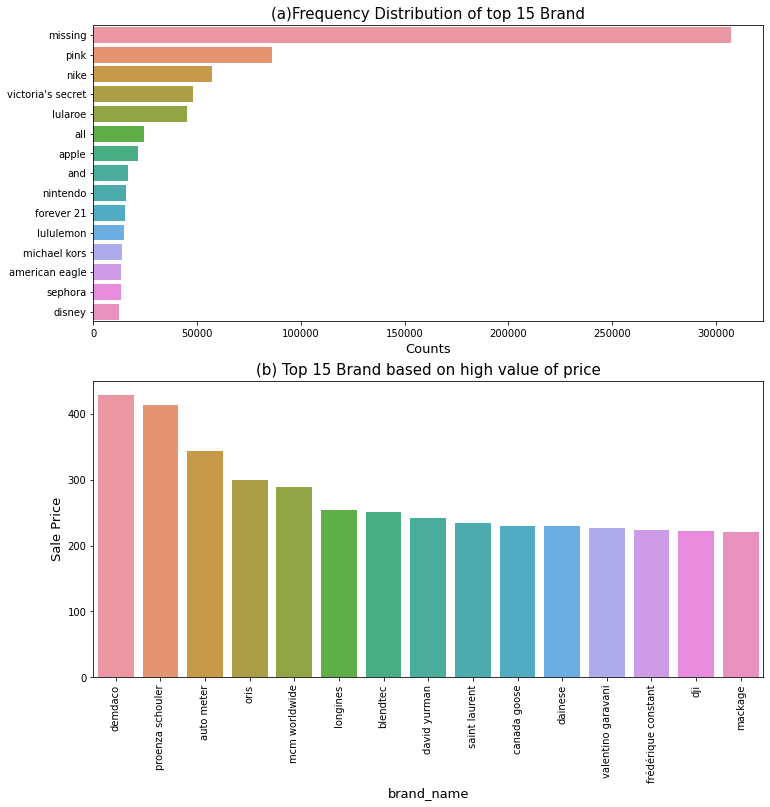

In [70]:
title1='Frequency Distribution of top 15 Brand'
title2='Top 15 Brand based on high value of price'
plot_categories('brand_name',title1,title2)

In [71]:
product_brand_count=Counter(list(train['brand_name']))
product_brand_count.most_common(10)

[('missing', 307465),
 ('pink', 86173),
 ('nike', 57179),
 ("victoria's secret", 47942),
 ('lularoe', 44904),
 ('all', 24319),
 ('apple', 21665),
 ('and', 16448),
 ('nintendo', 15660),
 ('forever 21', 15025)]

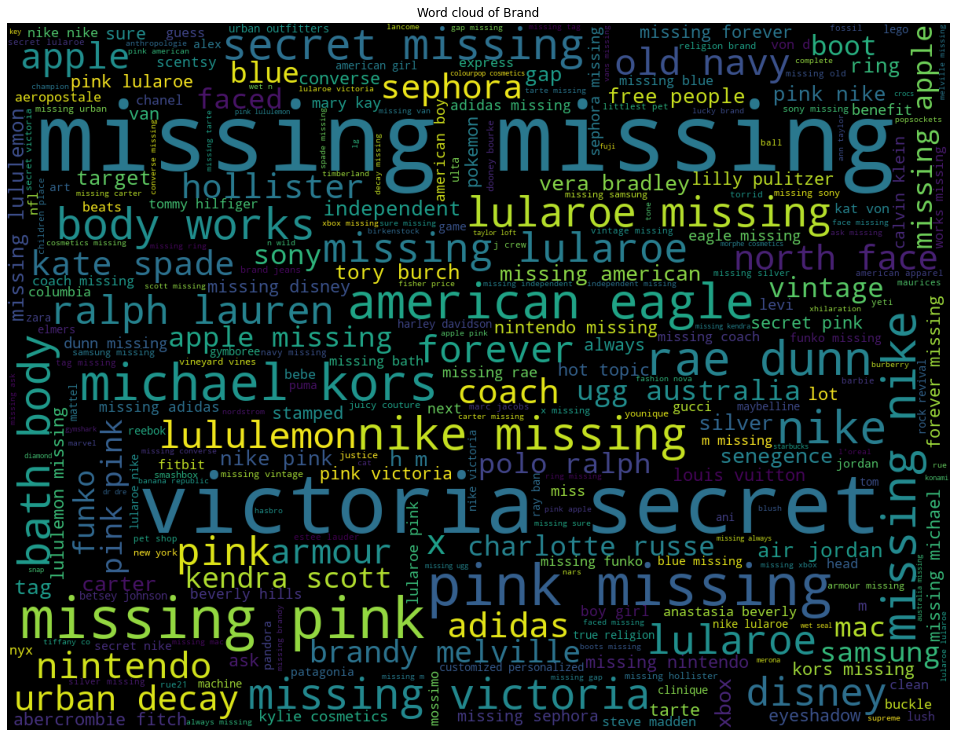

In [57]:
plt.figure(figsize = (18, 13))
plt.title('Word cloud of Brand')
wc = WordCloud(max_words=300,width = 1200, height = 900).generate(" ".join(train['brand_name'].astype(str)))
plt.imshow(wc)
plt.axis("off")
plt.show()

##### Observation

<li> After applying immputer missing value decrease upto 62%.

### Make new Features

In [76]:
train['name_len']=train['name'].apply(lambda x:len(x.split()))

In [77]:
test['name_len']=test['name'].apply(lambda x:len(x.split()))

In [78]:
train['name_len'].describe()

count    1.462949e+06
mean     4.515163e+00
std      1.711884e+00
min      0.000000e+00
25%      3.000000e+00
50%      4.000000e+00
75%      6.000000e+00
max      1.700000e+01
Name: name_len, dtype: float64

In [79]:
for i in range(0,101,10):
    print("{} th percentile is: {}".format(i,np.percentile(train['name_len'],i)))

0 th percentile is: 0.0
10 th percentile is: 2.0
20 th percentile is: 3.0
30 th percentile is: 3.0
40 th percentile is: 4.0
50 th percentile is: 4.0
60 th percentile is: 5.0
70 th percentile is: 5.0
80 th percentile is: 6.0
90 th percentile is: 7.0
100 th percentile is: 17.0


In [80]:
for i in range(90,101,1):
    print("{} th percentile is: {}".format(i,np.percentile(train['name_len'],i)))

90 th percentile is: 7.0
91 th percentile is: 7.0
92 th percentile is: 7.0
93 th percentile is: 7.0
94 th percentile is: 7.0
95 th percentile is: 7.0
96 th percentile is: 8.0
97 th percentile is: 8.0
98 th percentile is: 8.0
99 th percentile is: 8.0
100 th percentile is: 17.0


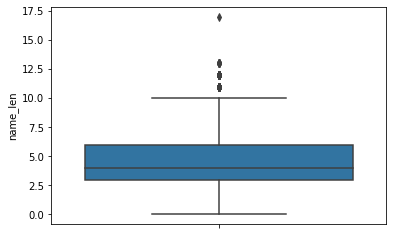

In [81]:
sns.boxplot(y="name_len", data =train)
plt.show()

In [82]:
train['item_len']=train['item_description'].apply(lambda x:len(x.split()))
test['item_len']=test['item_description'].apply(lambda x:len(x.split()))

In [83]:
train['item_len'].describe()

count    1.462949e+06
mean     1.947732e+01
std      2.237783e+01
min      0.000000e+00
25%      6.000000e+00
50%      1.200000e+01
75%      2.300000e+01
max      2.530000e+02
Name: item_len, dtype: float64

In [84]:
for i in range(0,101,10):
    print("{} th percentile is: {}".format(i,np.percentile(train['item_len'],i)))

0 th percentile is: 0.0
10 th percentile is: 3.0
20 th percentile is: 5.0
30 th percentile is: 7.0
40 th percentile is: 9.0
50 th percentile is: 12.0
60 th percentile is: 15.0
70 th percentile is: 20.0
80 th percentile is: 27.0
90 th percentile is: 45.0
100 th percentile is: 253.0


In [85]:
for i in range(90,101,1):
    print("{} th percentile is: {}".format(i,np.percentile(train['item_len'],i)))

90 th percentile is: 45.0
91 th percentile is: 48.0
92 th percentile is: 51.0
93 th percentile is: 56.0
94 th percentile is: 61.0
95 th percentile is: 67.0
96 th percentile is: 75.0
97 th percentile is: 85.0
98 th percentile is: 99.0
99 th percentile is: 115.0
100 th percentile is: 253.0


In [86]:
value=train["item_len"].values
value= np.sort(value,axis = None)
for i in np.arange(0.0, 1.0, 0.1):
    print("{}th percentile is {}".format(99+i,value[int(len(value)*(float(99+i)/100))]))
print("100th percentile is ",value[-1])

99.0th percentile is 115
99.1th percentile is 117
99.2th percentile is 119
99.3th percentile is 122
99.4th percentile is 125
99.5th percentile is 127
99.6th percentile is 131
99.7th percentile is 135
99.8th percentile is 141
99.9th percentile is 148
100th percentile is  253


#### Polarity Score

In [87]:
import nltk
from tqdm import tqdm
from nltk.sentiment.vader import SentimentIntensityAnalyzer
def generate_sentiment_scores(data):
    sid = SentimentIntensityAnalyzer()
    neg=[]
    pos=[]
    neu=[]
    comp=[]
    for sentence in tqdm(data['item_description'].values): 
        sentence_sentiment_score = sid.polarity_scores(sentence)
        comp.append(sentence_sentiment_score['compound'])
        neg.append(sentence_sentiment_score['neg'])
        pos.append(sentence_sentiment_score['pos'])
        neu.append(sentence_sentiment_score['neu'])
    return comp,neg,pos,neu

In [88]:
train['compound'],train['negative'],train['positive'],train['neutral']=generate_sentiment_scores(train)

100%|██████████████████████████████████████████████████████████████████████| 1462949/1462949 [22:54<00:00, 1064.01it/s]


In [89]:
test['compound'],test['negative'],test['positive'],test['neutral']=generate_sentiment_scores(test)

100%|██████████████████████████████████████████████████████████████████████| 3460725/3460725 [56:17<00:00, 1024.57it/s]


#### Expensive Brand

In [93]:
def expensive(data):
    unique_brand=data['brand_name'].unique()
    expensive_brand=[]
    for brand in tqdm(unique_brand):
        new_data=data[data['brand_name']==brand][['brand_name','price']].values
        for row in new_data:
            if row[1]>2.5:
                expensive_brand.append(row[0])
                
    return expensive_brand

In [94]:
expensive_brand=expensive(train)

100%|██████████████████████████████████████████████████████████████████████████████| 4791/4791 [31:26<00:00,  2.54it/s]


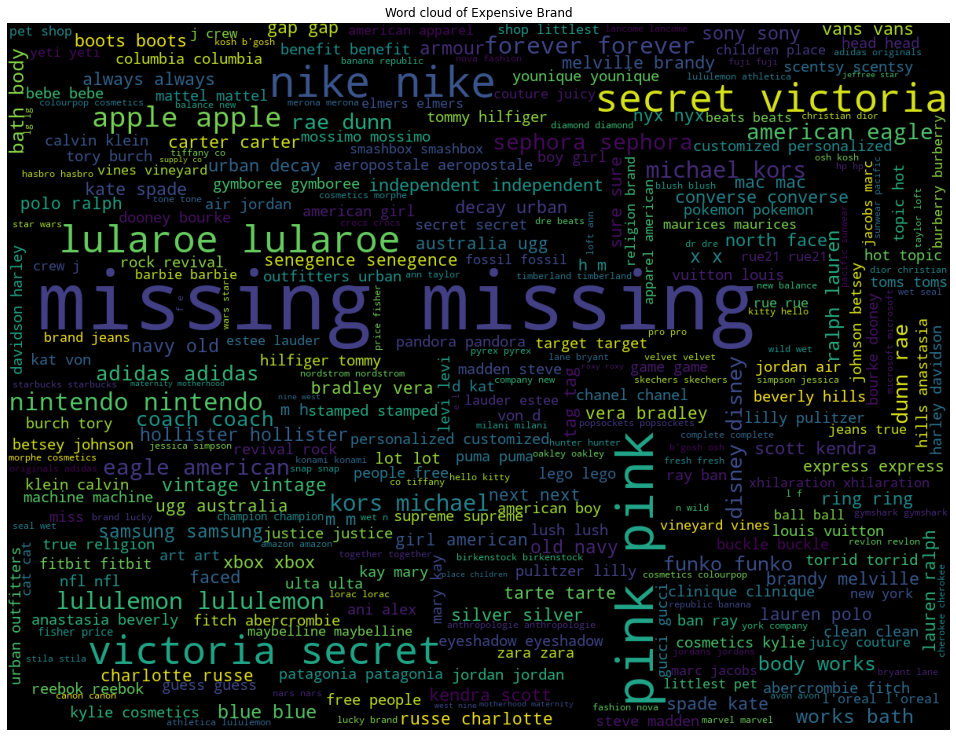

In [98]:
plt.figure(figsize = (18, 13))
plt.title('Word cloud of Expensive Brand')
wc = WordCloud(max_words=300,width = 1200, height = 900).generate(" ".join(expensive_brand))
plt.imshow(wc)
plt.axis("off")
plt.show()


# Bivariate Analysis

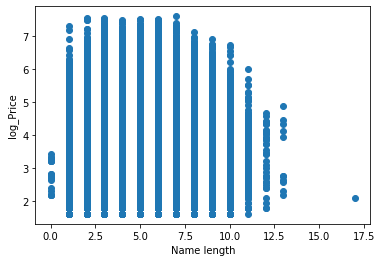

In [99]:
plt.scatter(train['name_len'],train['log_price'])
plt.xlabel('Name length')
plt.ylabel('log_Price')
plt.show()

Text(0, 0.5, 'Item length')

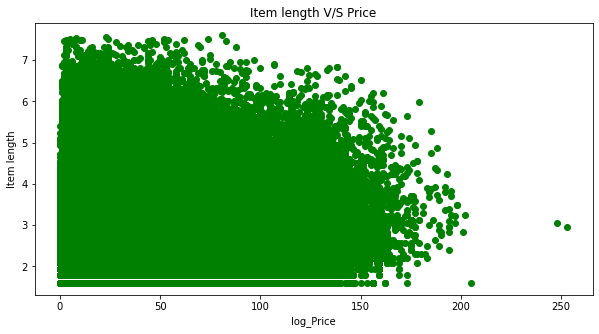

In [100]:
plt.figure(figsize=(10,5))
plt.title('Item length V/S Price')
plt.scatter(train['item_len'],train['log_price'],color='green')
plt.xlabel('log_Price')
plt.ylabel('Item length')

##### Observation

<li> Item_len and price are inversely proportional to each other.

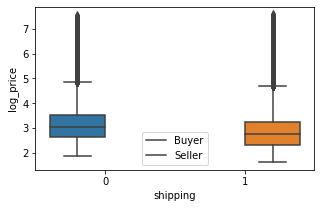

In [101]:

plt.figure(figsize=(5,3))
ax = sns.boxplot(x=train['shipping'],y=train['log_price'],hue=train['shipping'])
plt.ylabel('log_price')
ax.legend(['Buyer','Seller'])

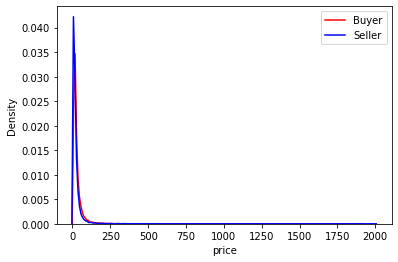

In [123]:
train_shiping_0=train[train['shipping']==0]
train_shiping_1=train[train['shipping']==1]
sns.distplot(train_shiping_0['price'], hist=False,color='red',label='Buyer')
sns.distplot(train_shiping_1['price'], hist=False,color='blue',label='Seller')
plt.legend()

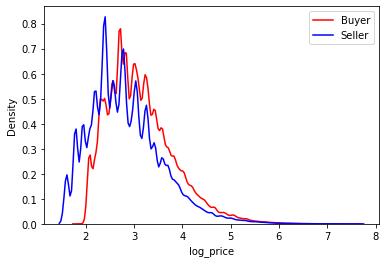

In [129]:
sns.distplot(train_shiping_0['log_price'], hist=False,color='red',label='Buyer')
sns.distplot(train_shiping_1['log_price'], hist=False,color='blue',label='Seller')
plt.legend()

##### Observation

<li> Shipping value 0 and 1 has same type of box plot with price features.

In [103]:
train_item_1=train[train['item_condition_id']==1]
train_item_2=train[train['item_condition_id']==2]
train_item_3=train[train['item_condition_id']==3]
train_item_4=train[train['item_condition_id']==4]
train_item_5=train[train['item_condition_id']==5]

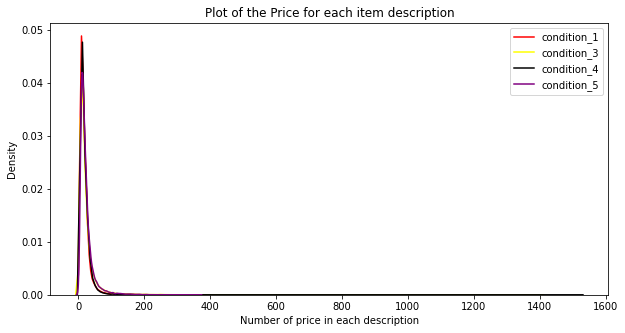

In [124]:
plt.figure(figsize=(10,5))
sns.distplot(train_item_1['price'], hist=False,color='red',label='condition_1')
sns.distplot(train_item_2['price'], hist=False,color='blue',label='condition_2')
sns.distplot(train_item_3['price'], hist=False,color='yellow',label='condition_3')
sns.distplot(train_item_4['price'], hist=False,color='black',label='condition_4')
sns.distplot(train_item_5['price'], hist=False,color='purple',label='condition_5')
plt.legend()
plt.title('Plot of the Price for each item description')
plt.xlabel('Number of price in each description')
plt.show()

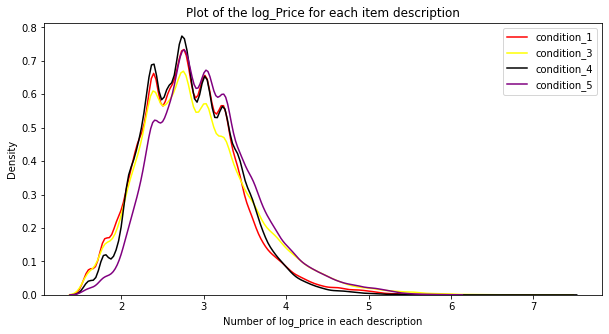

In [130]:
plt.figure(figsize=(10,5))
sns.distplot(train_item_1['log_price'], hist=False,color='red',label='condition_1')
sns.distplot(train_item_2['log_price'], hist=False,color='blue',label='condition_2')
sns.distplot(train_item_3['log_price'], hist=False,color='yellow',label='condition_3')
sns.distplot(train_item_4['log_price'], hist=False,color='black',label='condition_4')
sns.distplot(train_item_5['log_price'], hist=False,color='purple',label='condition_5')
plt.legend()
plt.title('Plot of the log_Price for each item description')
plt.xlabel('Number of log_price in each description')
plt.show()

Text(0, 0.5, 'log_price')

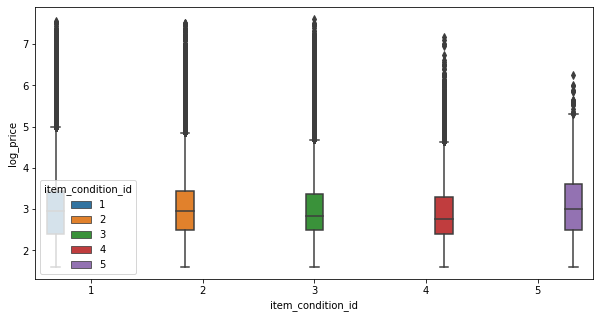

In [105]:
plt.figure(figsize=(10,5))
ax = sns.boxplot(x=train['item_condition_id'],y=train['log_price'],hue=train['item_condition_id'])
plt.ylabel('log_price')

##### Observation

<li> item_condition_id value 5 contain low value of outliers.

#### Top 5 Brand v/s price

In [106]:
train_brand_1=train[train['brand_name']=='missing']
train_brand_2=train[train['brand_name']=='nike']
train_brand_3=train[train['brand_name']=='pink']
train_brand_4=train[train['brand_name']=="victoria's secret"]
train_brand_5=train[train['brand_name']=='lulaRoe']

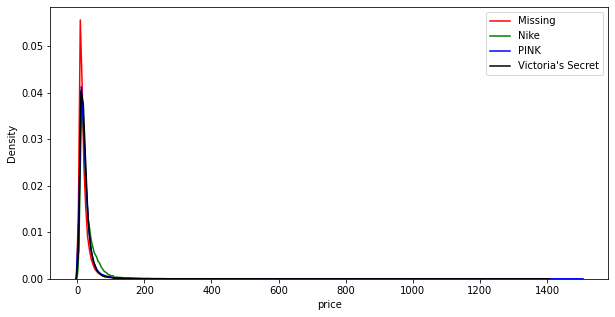

In [125]:
plt.figure(figsize=(10,5))
sns.distplot(train_brand_1['price'], hist=False,color='red',label='Missing')
sns.distplot(train_brand_2['price'], hist=False,color='green',label='Nike')
sns.distplot(train_brand_3['price'], hist=False,color='blue',label='PINK')
sns.distplot(train_brand_4['price'], hist=False,color='black',label="Victoria's Secret")
sns.distplot(train_brand_5['price'], hist=False,color='pink',label='LuLaRoe')
plt.legend()

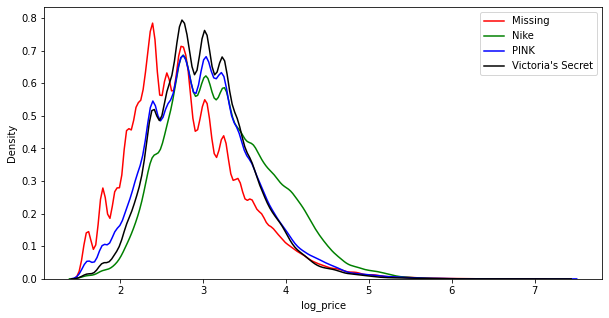

In [131]:
plt.figure(figsize=(10,5))
sns.distplot(train_brand_1['log_price'], hist=False,color='red',label='Missing')
sns.distplot(train_brand_2['log_price'], hist=False,color='green',label='Nike')
sns.distplot(train_brand_3['log_price'], hist=False,color='blue',label='PINK')
sns.distplot(train_brand_4['log_price'], hist=False,color='black',label="Victoria's Secret")
sns.distplot(train_brand_5['log_price'], hist=False,color='pink',label='LuLaRoe')
plt.legend()

#### Top 5 main_cat v/s Price

In [108]:
train_main_1=train[train['main_category']=='Women']
train_main_2=train[train['main_category']=='Beauty']
train_main_3=train[train['main_category']=='Kids']
train_main_4=train[train['main_category']=="Electronics"]
train_main_5=train[train['main_category']=='Men']

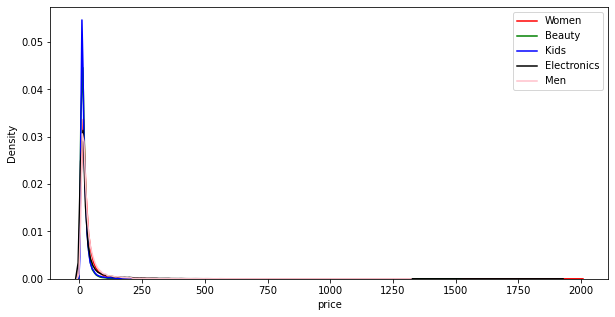

In [126]:
plt.figure(figsize=(10,5))
sns.distplot(train_main_1['price'], hist=False,color='red',label='Women')
sns.distplot(train_main_2['price'], hist=False,color='green',label='Beauty')
sns.distplot(train_main_3['price'], hist=False,color='blue',label='Kids')
sns.distplot(train_main_4['price'], hist=False,color='black',label="Electronics")
sns.distplot(train_main_5['price'], hist=False,color='pink',label='Men')
plt.legend()

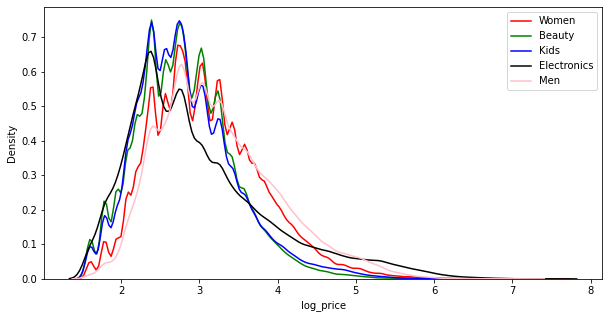

In [132]:
plt.figure(figsize=(10,5))
sns.distplot(train_main_1['log_price'], hist=False,color='red',label='Women')
sns.distplot(train_main_2['log_price'], hist=False,color='green',label='Beauty')
sns.distplot(train_main_3['log_price'], hist=False,color='blue',label='Kids')
sns.distplot(train_main_4['log_price'], hist=False,color='black',label="Electronics")
sns.distplot(train_main_5['log_price'], hist=False,color='pink',label='Men')
plt.legend()

#### Top 5 sub_cat v/s Price

In [110]:
train_sub_1=train[train['sub_category']=='Makeup']
train_sub_2=train[train['sub_category']=='Athletic Apparel']
train_sub_3=train[train['sub_category']=='Shoes']
train_sub_4=train[train['sub_category']=="Tops & Blouses"]
train_sub_5=train[train['sub_category']=='Jewelry']

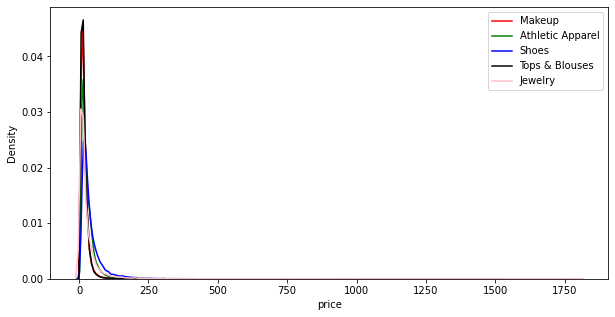

In [127]:
plt.figure(figsize=(10,5))
sns.distplot(train_sub_1['price'], hist=False,color='red',label='Makeup')
sns.distplot(train_sub_2['price'], hist=False,color='green',label='Athletic Apparel')
sns.distplot(train_sub_3['price'], hist=False,color='blue',label='Shoes')
sns.distplot(train_sub_4['price'], hist=False,color='black',label="Tops & Blouses")
sns.distplot(train_sub_5['price'], hist=False,color='pink',label='Jewelry')
plt.legend()

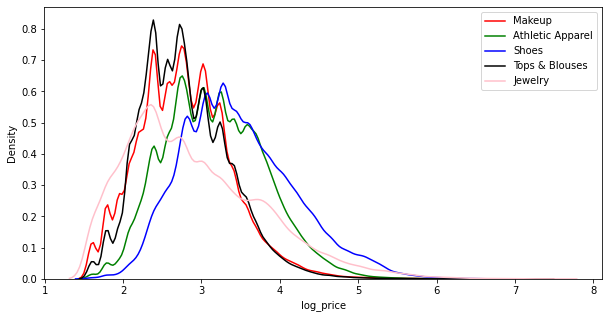

In [133]:
plt.figure(figsize=(10,5))
sns.distplot(train_sub_1['log_price'], hist=False,color='red',label='Makeup')
sns.distplot(train_sub_2['log_price'], hist=False,color='green',label='Athletic Apparel')
sns.distplot(train_sub_3['log_price'], hist=False,color='blue',label='Shoes')
sns.distplot(train_sub_4['log_price'], hist=False,color='black',label="Tops & Blouses")
sns.distplot(train_sub_5['log_price'], hist=False,color='pink',label='Jewelry')
plt.legend()

####  Top 5 item_cat v/s price

In [134]:
train_item_1=train[train['item_category']=='Face']
train_item_2=train[train['item_category']=='Pants,Tights,Leggings']
train_item_3=train[train['item_category']=='Other']
train_item_4=train[train['item_category']=="T-Shirts"]
train_item_5=train[train['item_category']=='Shoes']

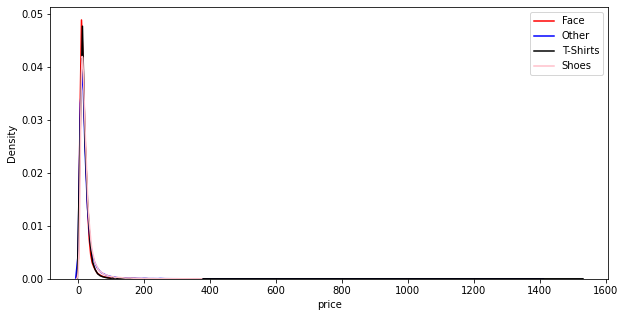

In [128]:
plt.figure(figsize=(10,5))
sns.distplot(train_item_1['price'], hist=False,color='red',label='Face')
sns.distplot(train_item_2['price'], hist=False,color='green',label='Pants,Tights,Leggings')
sns.distplot(train_item_3['price'], hist=False,color='blue',label='Other')
sns.distplot(train_item_4['price'], hist=False,color='black',label="T-Shirts")
sns.distplot(train_item_5['price'], hist=False,color='pink',label='Shoes')
plt.legend()

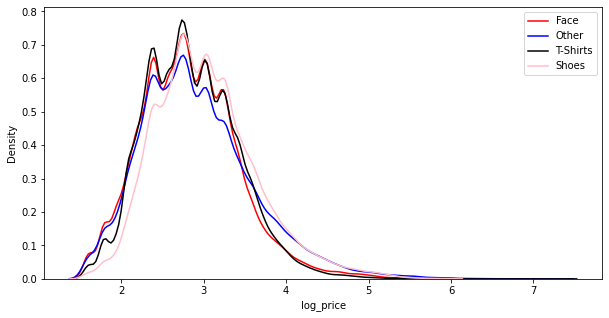

In [135]:
plt.figure(figsize=(10,5))
sns.distplot(train_item_1['log_price'], hist=False,color='red',label='Face')
sns.distplot(train_item_2['log_price'], hist=False,color='green',label='Pants,Tights,Leggings')
sns.distplot(train_item_3['log_price'], hist=False,color='blue',label='Other')
sns.distplot(train_item_4['log_price'], hist=False,color='black',label="T-Shirts")
sns.distplot(train_item_5['log_price'], hist=False,color='pink',label='Shoes')
plt.legend()

#### Rare word for each item_condition

In [116]:
train['text']=train['name']+" "+train['item_description']
test['text']=test['name']+" "+test['item_description']
def rare_word_condition(data,ide):
    data=data[data['item_condition_id']==ide][['text']]
    word= data['text'].str.lower().str.cat(sep = ' ')
    words = nltk.tokenize.word_tokenize(word)
    word_dist = nltk.FreqDist(words)
    df_freq = pd.DataFrame(word_dist.most_common(),columns=['Word', 'Frequency'])
    length=df_freq.shape[0]
    df_freq = df_freq.sort_values(by=['Frequency'],ascending = True)[0:length//2]
    plt.figure(figsize = (18, 13))
    plt.title('Word cloud of Rare word with item_condition_id='+str(ide))
    wc = WordCloud(max_words=300,width = 1200, height = 900).generate(" ".join(df_freq['Word'].astype(str)))
    plt.imshow(wc)
    plt.axis("off")
    plt.show()

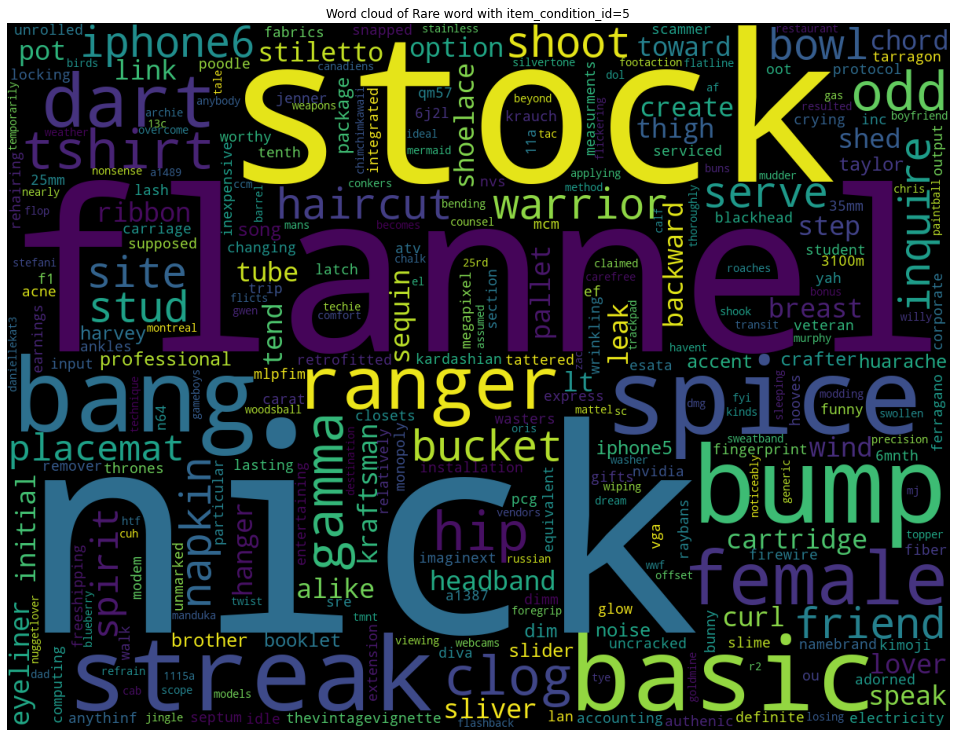

In [117]:
rare_word_condition(train,5)

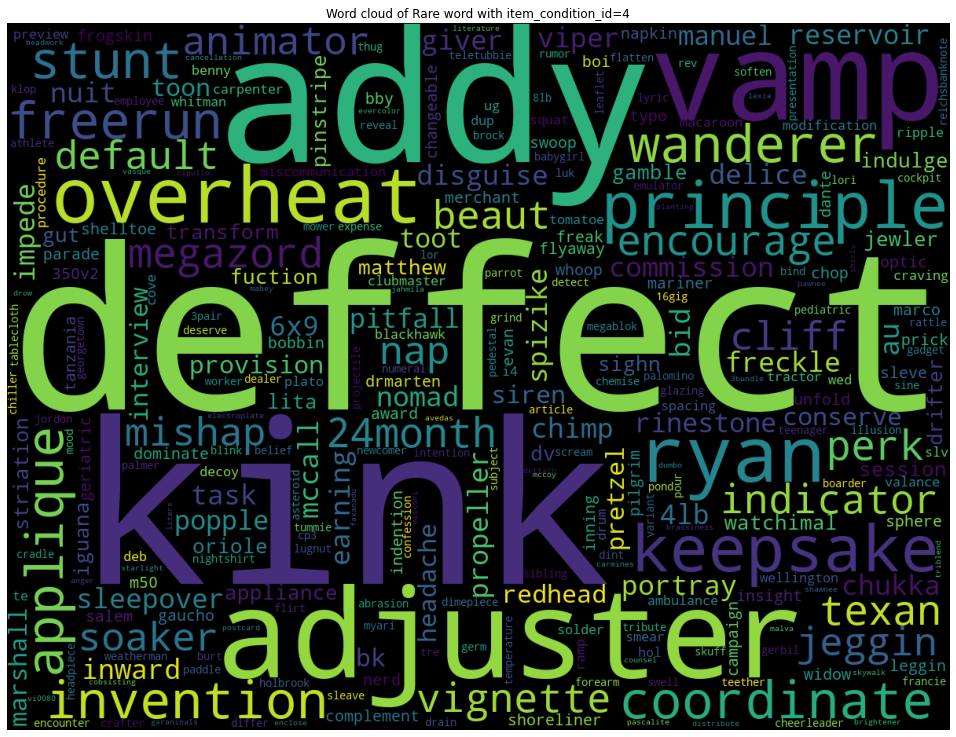

In [118]:
rare_word_condition(train,4)

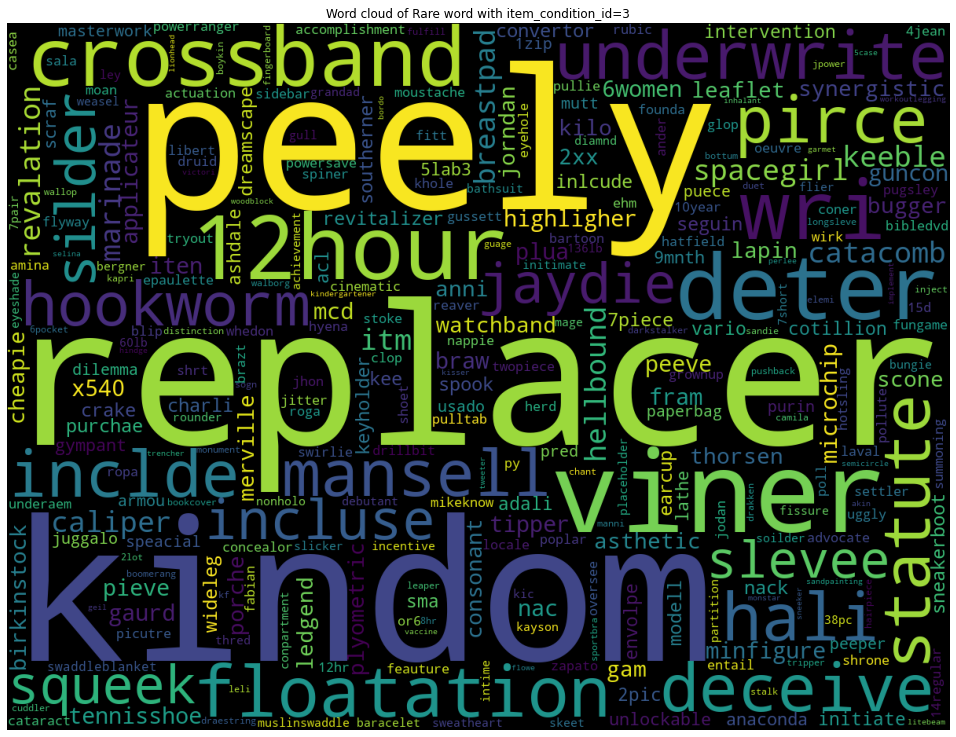

In [119]:
rare_word_condition(train,3)

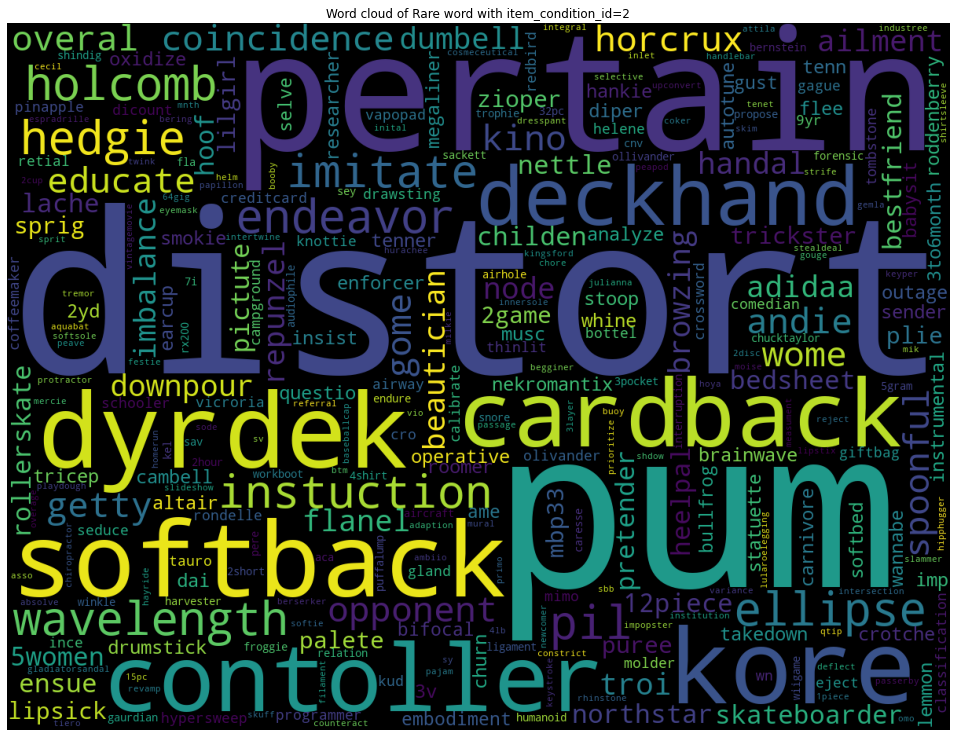

In [120]:
rare_word_condition(train,2)

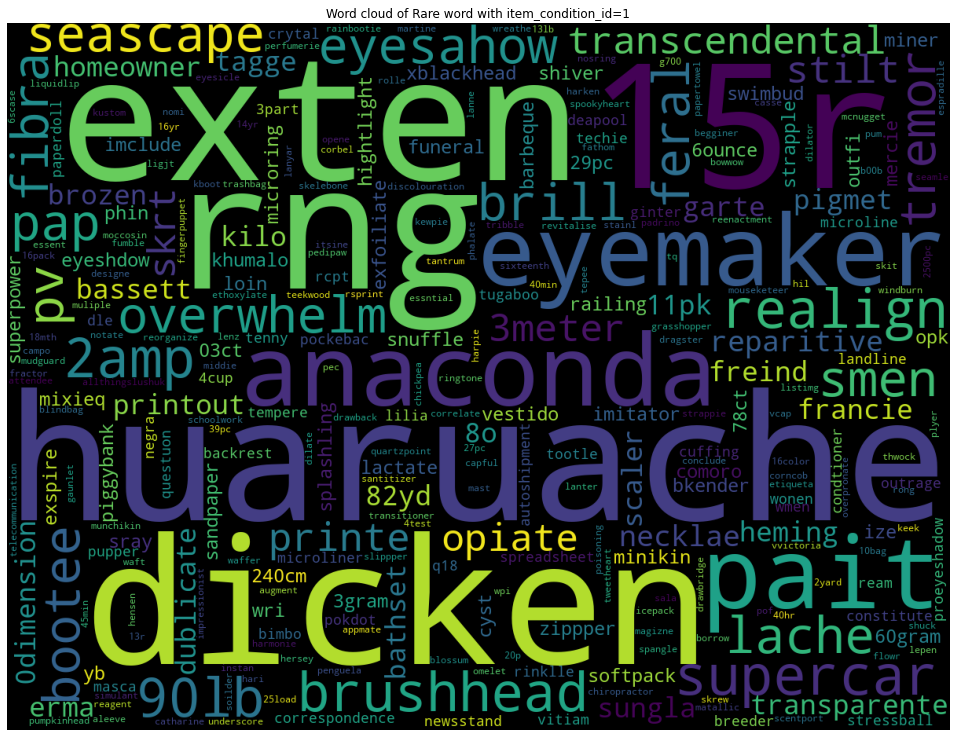

In [121]:
rare_word_condition(train,1)

<AxesSubplot:>

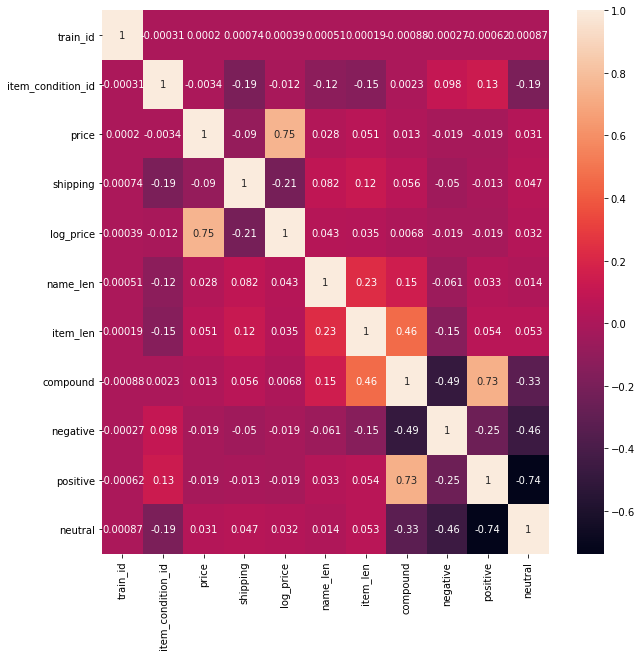

In [122]:
plt.figure(figsize=(10,10))
sns.heatmap(train.corr(),annot=True)

In [164]:
top_brands = train.groupby('brand_name').median().sort_values("price", ascending=False)['log_price'].reset_index()[:10]

In [165]:
top_brands

,brand_name,log_price
0,demdaco,4.570977
1,auto meter,5.843544
2,proenza schouler,5.752658
3,oris,5.707110
4,longines,5.541264
5,blendtec,5.525453
6,dainese,5.442418
7,frédérique constant,5.416100
8,david yurman,5.398163
9,irobot,5.375278


In [3]:
train.to_pickle('train.pkl',protocol=5)
test.to_pickle('test.pkl',protocol=5)